# Deep Learning Based Potato Leaf Disease Detection using Explainable AI (XAI)

# Dataset Details
### Dataset is taken from an online platform kaggle.com. The name of the dataset is, "Potato Dataset"
### Dataset Link : https://www.kaggle.com/datasets/arajmishra/potato-dataset

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/f5bd2732-197b-4d8e-bb50-a4966dc416f5___RS_HL 1840.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/5a3fc4bb-a78c-4276-8934-f0b037ffb860___RS_HL 5412.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/5df30492-0b54-474d-8883-bba9474ca88f___RS_HL 1801.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/2e0b8b4b-e900-408b-b760-730690bbd382___RS_HL 1901.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/774875d3-438a-4305-afe2-7d59e2925dc4_

# Neural Network Model with TensorFlow and Keras for Classification

* This code snippet demonstrates the construction of a neural network model for classification tasks using TensorFlow and its high-level API Keras. The model is designed to learn patterns in data and make predictions on unseen instances. Additionally, the matplotlib library is utilized to visualize training performance.



In [ ]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt

2024-04-21 09:50:14.262737: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 09:50:14.262836: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 09:50:14.390368: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
BATCH_SIZE=32
IMAGE_SIZE=224
CHANNELS=3
EPOCHS=50

# Loading Image Dataset for Training
* The code snippet uses tf.keras.preprocessing.image_dataset_from_directory() function to load the image dataset for training. This function is part of TensorFlow's Keras utilities for preprocessing image data. It facilitates loading images directly from a directory structure, where each subdirectory represents a class label.



In [ ]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    "/kaggle/input/potato-dataset/PlantVillage",
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


# Retrieving Class Names from the Dataset
* The code snippet retrieves the class names from the previously loaded dataset. This dataset contains image data for a classification task, where each subdirectory in the specified directory represents a class label.



In [ ]:
class_names=dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Data Visualization

In [ ]:
import os

Potato___Early_blight_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___Early_blight'
Potato___Late_blight_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___Late_blight'
Potato___healthy_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___healthy'

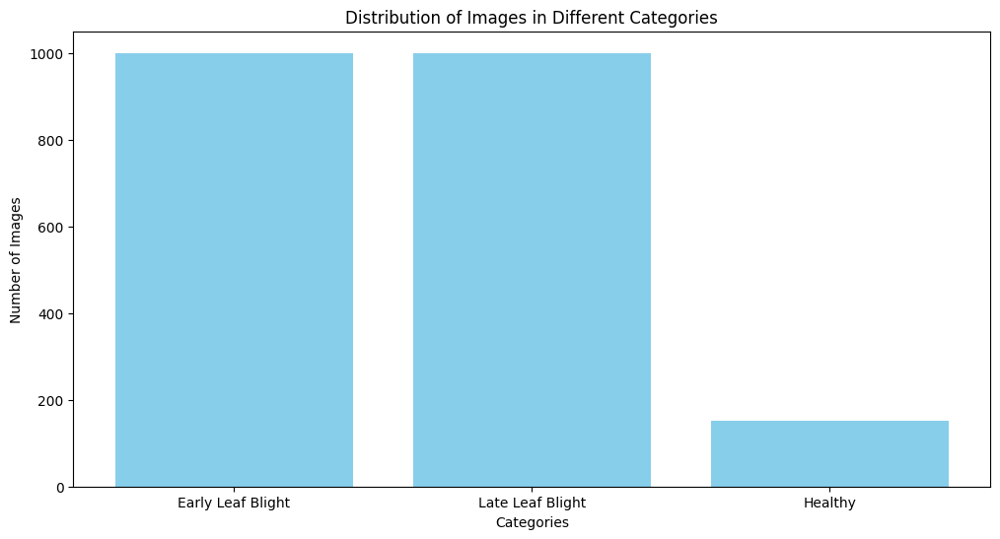

In [ ]:
import matplotlib.pyplot as plt

# Define the categories and corresponding counts
categories = ['Early Leaf Blight','Late Leaf Blight','Healthy']
counts = [len(os.listdir(Potato___Early_blight_dir)), len(os.listdir(Potato___Late_blight_dir)), len(os.listdir(Potato___healthy_dir))]

# Create a bar plot to visualize the distribution of images
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Different Categories')
plt.show()

# Visualizing Sample Images from the Dataset
* The code snippet visualizes a sample batch of images along with their corresponding labels from the loaded dataset. Matplotlib is used to create a grid of images with their respective class labels.


(32, 224, 224, 3)
[2 1 1 1 0 0 2 2 1 1 1 0 1 0 1 0 1 1 0 0 1 2 1 2 0 1 1 1 0 1 1 1]


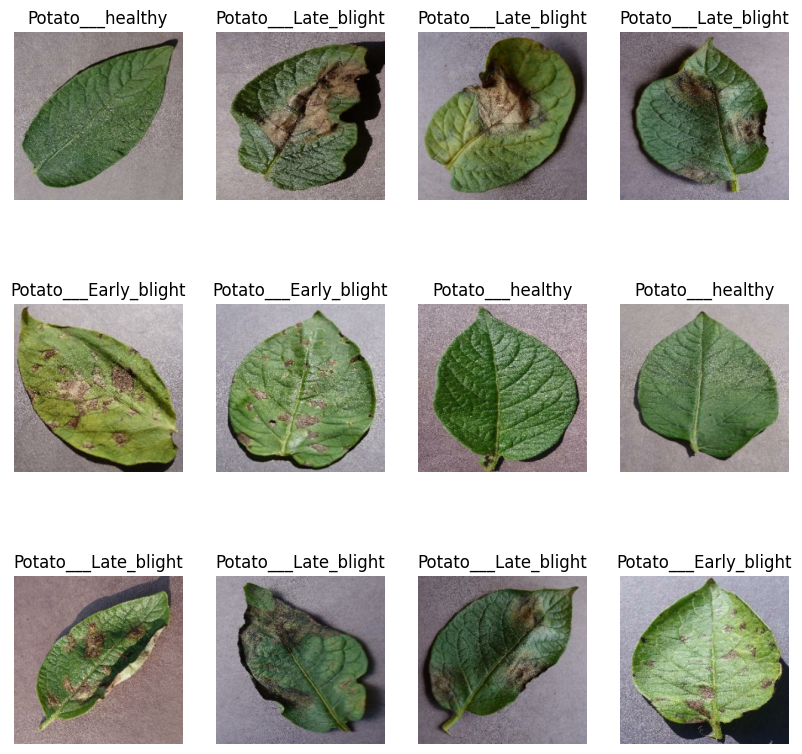

In [ ]:
plt.figure(figsize=(10,10))
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

# Function to Split Dataset into Training and Validation Sets
*  The provided function get_dataset_partitions_tf() splits a given dataset into training and validation sets according to specified proportions. It also supports shuffling the dataset before splitting.



In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.2, shuffle=True, shuffle_size=10000):
    assert(train_split+val_split)==1

    ds_size=len(ds)

    if shuffle:
        ds=ds.shuffle(shuffle_size, seed=12)

    train_size=int(train_split*ds_size)
    val_size=int(val_split*ds_size)

    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)

    return train_ds, val_ds

In [ ]:
train_ds, val_ds =get_dataset_partitions_tf(dataset)

In [ ]:
len(train_ds)

54

In [ ]:
len(val_ds)

13

# Data Augmentation

In [ ]:
train_ds= train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds= val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].numpy()/255)

[[[0.78319323 0.7596638  0.76750696]
  [0.787675   0.7641456  0.77198875]
  [0.79085636 0.76732695 0.7751701 ]
  ...
  [0.82230896 0.8027011  0.8183874 ]
  [0.8150059  0.79539806 0.81108433]
  [0.7985591  0.7789513  0.79463756]]

 [[0.762465   0.7389356  0.7467787 ]
  [0.7669468  0.7434174  0.7512605 ]
  [0.7717287  0.7481993  0.7560424 ]
  ...
  [0.82158875 0.8019809  0.8176672 ]
  [0.82298917 0.8033813  0.8190676 ]
  [0.817747   0.79813915 0.8138254 ]]

 [[0.7518207  0.7282913  0.7361344 ]
  [0.75660264 0.73307323 0.7409164 ]
  [0.7635854  0.740056   0.7478991 ]
  ...
  [0.80106044 0.7814526  0.79713887]
  [0.8092237  0.78961587 0.80530214]
  [0.81744707 0.7978392  0.8135255 ]]

 ...

 [[0.57865214 0.56296587 0.56688744]
  [0.57326967 0.5559027  0.56066465]
  [0.5638455  0.5403161  0.54815924]
  ...
  [0.5578023  0.5342729  0.5499592 ]
  [0.5782113  0.5546819  0.5703682 ]
  [0.53941494 0.51588553 0.5315718 ]]

 [[0.5591033  0.54341704 0.5473386 ]
  [0.54613817 0.5287712  0.53353316]


In [ ]:
! pip install preprocessing

In [ ]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1./255),
])

In [ ]:
data_augmentation=tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

In [ ]:
n_classes=3

# Our own Convolutional Neural Network (CNN) for Image Classification
* The provided code presents an extended CNN model using TensorFlow and Keras for image classification tasks.



In [ ]:
input_shape=(BATCH_SIZE, IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes=3

model_1= models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(256,activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])
model_1.build(input_shape=input_shape)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [ ]:
model_1.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (32, 224, 224, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (32, 224, 224, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 222, 222, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 111, 111, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (32, 109, 109, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (32, 54, 54, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (32, 52, 52, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (32, 26, 26, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (32, 24, 24, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (32, 12, 12, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (32, 10, 10, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (32, 5, 5, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (32, 3, 3, 128)        │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (32, 1, 1, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 128)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 256)              │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 3)                │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 237,827 (929.01 KB)

 Trainable params: 237,827 (929.01 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history=model_1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.4725 - loss: 0.9343 - val_accuracy: 0.4375 - val_loss: 0.9051
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.5093 - loss: 0.8611 - val_accuracy: 0.6418 - val_loss: 0.7444
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6664 - loss: 0.7323 - val_accuracy: 0.7043 - val_loss: 0.6975
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.7386 - loss: 0.5948 - val_accuracy: 0.8125 - val_loss: 0.4446
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7877 - loss: 0.4955 - val_accuracy: 0.8197 - val_loss: 0.3842
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.8752 - loss: 0.3282 - val_accuracy: 0.8630 - val_loss: 0.3073
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.8707 - loss: 0.2861 - val_accuracy: 0.8606 - val_loss: 0.3416
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.8897 - loss: 0.2757 - val_accuracy: 0.8990 - v

In [ ]:
scores=model_1.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9797 - loss: 0.0502


In [ ]:
scores

[0.04179057851433754, 0.9831730723381042]

In [ ]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

# Training History Metrics Extraction
* Accuracy (acc): Accuracy is a measure of the proportion of correctly classified instances out of the total instances. It indicates the model's overall performance on the training data.
* Validation Accuracy (val_acc): Validation accuracy represents the model's performance on a separate validation dataset, providing insights into its generalization capability.
* Loss (loss): Loss is a measure of the model's performance during training. It quantifies the difference between predicted and actual values.
* Validation Loss (val_loss): Validation loss measures the performance of the model on the validation dataset. It indicates how well the model generalizes to unseen data.


In [ ]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

In [ ]:
history.history['accuracy']

[0.47858795523643494,
 0.5561342835426331,
 0.6944444179534912,
 0.7760416865348816,
 0.7858796119689941,
 0.859375,
 0.8697916865348816,
 0.9103009104728699,
 0.9259259104728699,
 0.9403935074806213,
 0.9502314925193787,
 0.9594907164573669,
 0.9704861044883728,
 0.9623842835426331,
 0.9733796119689941,
 0.9560185074806213,
 0.9756944179534912,
 0.9623842835426331,
 0.9797453880310059,
 0.9780092835426331,
 0.9762731194496155,
 0.9797453880310059,
 0.9652777910232544,
 0.9832175970077515,
 0.9716435074806213,
 0.9785879850387573,
 0.9861111044883728,
 0.9884259104728699,
 0.9774305820465088,
 0.9855324029922485,
 0.9710648059844971,
 0.9820601940155029,
 0.9803240895271301,
 0.9861111044883728,
 0.9924768805503845,
 0.9803240895271301,
 0.984375,
 0.9878472089767456,
 0.9901620149612427,
 0.9930555820465088,
 0.9849537014961243,
 0.9913194179534912,
 0.9606481194496155,
 0.9861111044883728,
 0.9918981194496155,
 0.9907407164573669,
 0.9924768805503845,
 0.9918981194496155,
 0.99074071

# Training History Visualization
* The provided code visualizes the training history metrics, including accuracy and loss, over the epochs of model training. This visualization aids in understanding the model's performance and behavior during training and validation phases.



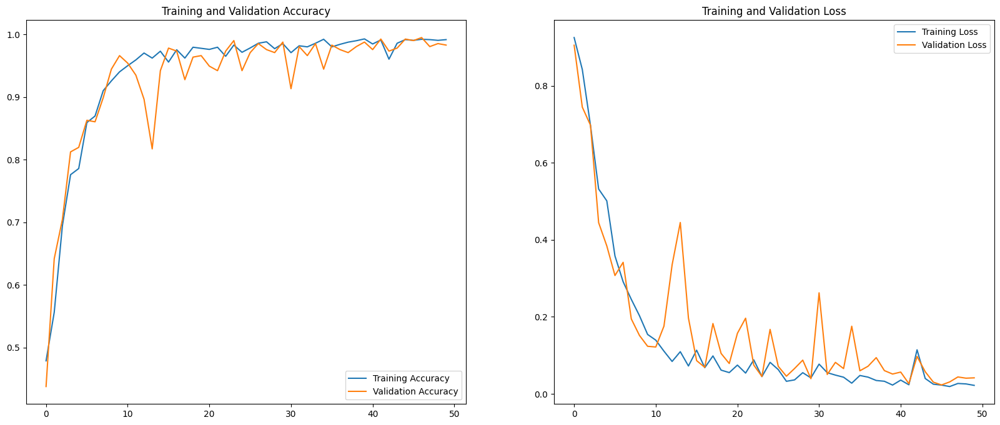

In [ ]:
EPOCHS=50
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


# Prediction of Image Labels from Validation Dataset
* This code segment demonstrates the process of predicting labels for images from a validation dataset using a pre-trained convolutional neural network (CNN) model (model_1). The prediction results are then compared with the actual labels to assess the model's performance.



First image to predict
Actual Label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
Predicted Label: Potato___Late_blight


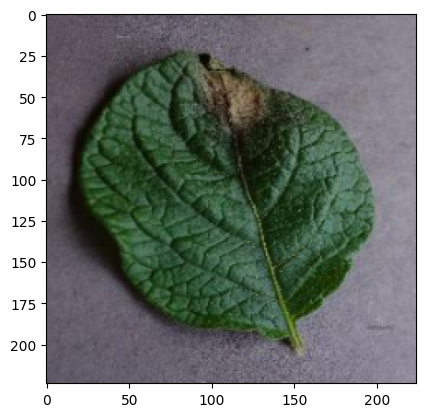

In [ ]:
import numpy as np
for images_batch, labels_batch in val_ds.take(1):
  first_image=images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:",class_names[labels_batch[0].numpy()])

  batch_prediction = model_1.predict(images_batch)
  print("Predicted Label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


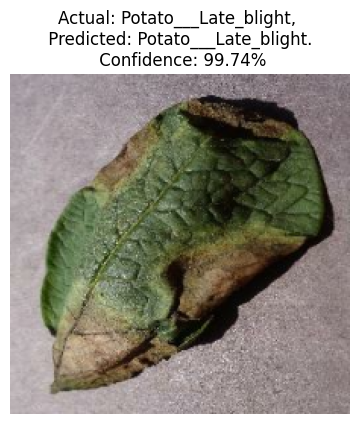

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


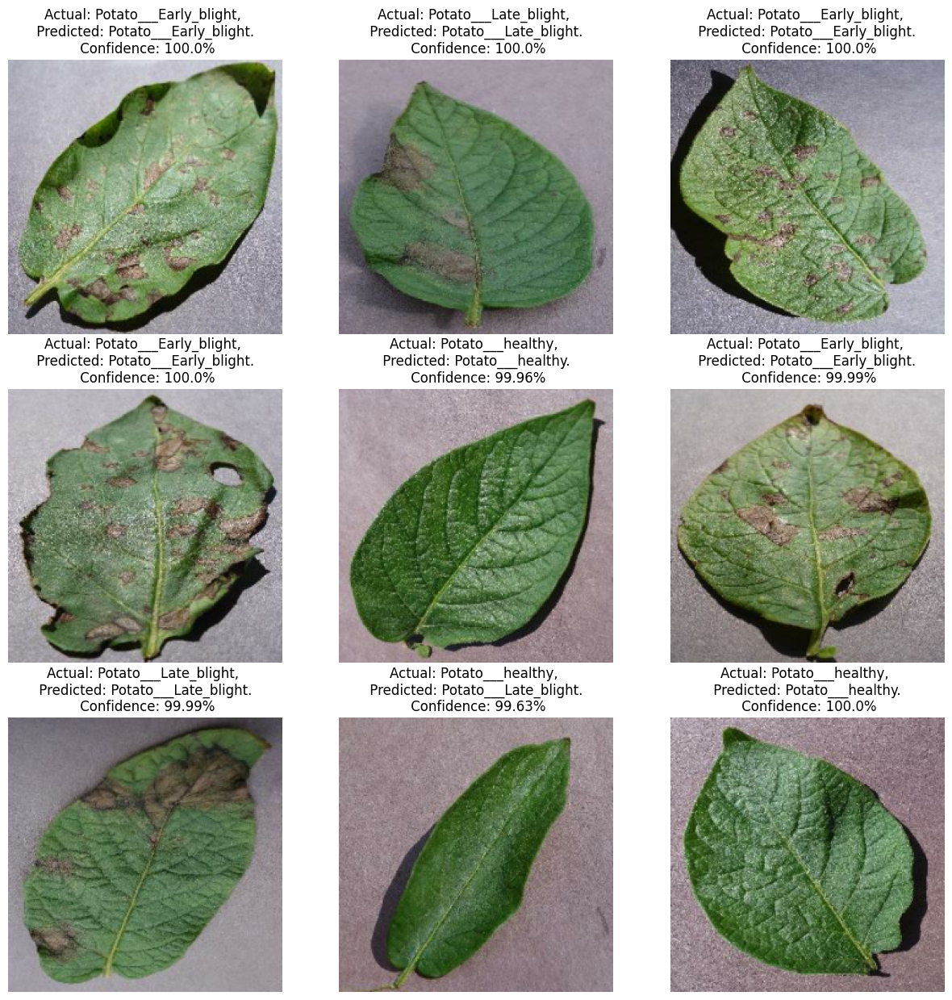

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# Saving the TensorFlow Model

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_1.save('/kaggle/working/model_potato_50epochs_99%acc.keras')


The provided code segment visualizes a subset of images from the validation dataset along with their predicted classes and confidence scores using the model_1

# Evaluating Model Predictions on Validation Dataset
The provided code segment aims to evaluate the predictions made by a trained model (model_1) on the validation dataset (val_ds). It stores the true labels (y_true) and predicted labels (y_pred) for later analysis.

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = model_1.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


# Evaluation Metrics Calculation
The provided code segment calculates various evaluation metrics to assess the performance of a classification model on the validation dataset.

Metrics Calculated:
* Accuracy: The proportion of correctly classified instances among all instances.
* Precision: The ability of the model to correctly classify positive instances among all instances it classified as positive.
* Recall: The ability of the model to correctly identify positive instances among all actual positive instances.
* F1 Score: The harmonic mean of precision and recall, providing a balanced measure between the two.


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9831730769230769
Precision: 0.9835748381209712
Recall: 0.9831730769230769
F1 Score: 0.9831667333814019


# Visualization of Confusion Matrix
*  The provided code segment visualizes the confusion matrix, which is a useful tool for understanding the performance of a classification model by analyzing the patterns of true and predicted labels.



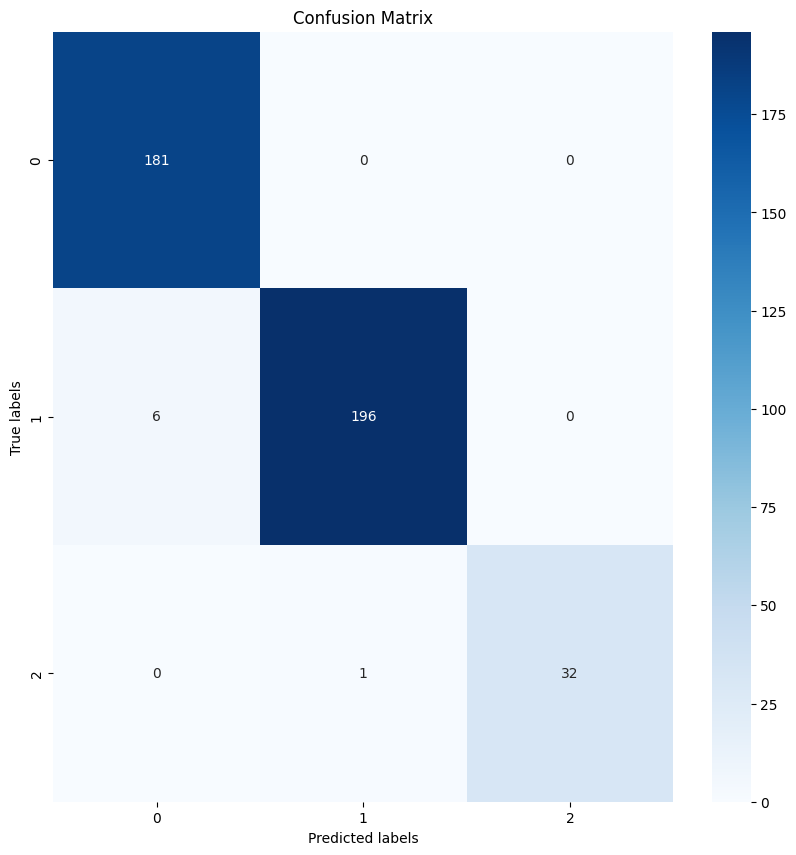

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

### ROC Curve

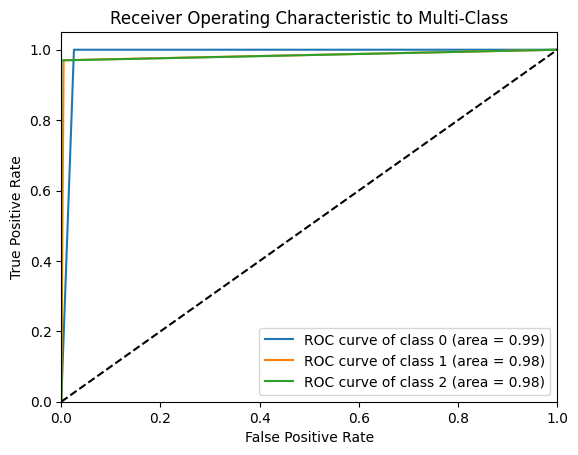

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

### AUC Score

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.984998499849985


# Saving the TensorFlow Model

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_1.save('/kaggle/working/model_potato_50epochs_99%acc1.keras')

# CNN Architecture Specification of the Base Research Paper
Layers:
Convolutional Layers:

* Number of Filters (Channels): 64, 128, 256, 512, 512
Kernel Size: 3x3 (Assumed same for all convolutional layers)

* Max Pooling Layers: Pooling Size: 2x2
Stride: Default (Assumed same for all max pooling layers)

* Fully Connected (Dense) Layers: Number of Neurons: Varies, with a final layer having 4096 neurons.
The value x before (x, 4096) needs to be specified.

In [ ]:
#Proposed Model in Research Paper
# activation units=64,128,256,512,512,4096,4096,1000
# kernel= 3,3
# max pooling =2,2

In [ ]:
input_shape=(224,224,3)

# Paper-Based CNN Model Architecture
The provided code defines a convolutional neural network (CNN) model architecture inspired by a paper.

In [ ]:
from tensorflow.keras import Input

model_paper = models.Sequential([
    Input(shape=input_shape),
    resize_and_rescale,
    data_augmentation,
    # conv1
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv2
    layers.Conv2D(128, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv3
    layers.Conv2D(256, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv4
    layers.Conv2D(512, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv5
    layers.Conv2D(512, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dense(4096, activation='relu'),
    layers.Dense(1000, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

In [ ]:
model_paper.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 109, 109, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 52, 52, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 24, 24, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 12, 12, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 10, 10, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4096)           │    52,432,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │         3,003 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 77,224,995 (294.59 MB)

 Trainable params: 77,224,995 (294.59 MB)

 Non-trainable params: 0 (0.00 B)

# Compilation of the Paper-Based CNN Model
The provided code compiles the paper-based convolutional neural network (CNN) model (model_paper) for training.

In [ ]:
model_paper.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# Training the Paper-Based CNN Model
The provided code snippet conducts the training of the paper-based convolutional neural network (CNN) model (model_paper).

In [ ]:
history_paper=model_paper.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - accuracy: 0.4428 - loss: 1.1319 - val_accuracy: 0.7692 - val_loss: 0.9119
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.4922 - loss: 0.8796 - val_accuracy: 0.6875 - val_loss: 0.8125
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.6598 - loss: 0.7742 - val_accuracy: 0.7740 - val_loss: 0.5452
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.7776 - loss: 0.5513 - val_accuracy: 0.8125 - val_loss: 0.5275
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.7822 - loss: 0.5764 - val_accuracy: 0.7572 - val_loss: 0.6557
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8292 - loss: 0.4713 - val_accuracy: 0.8389 - val_loss: 0.4590
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8494 - loss: 0.4125 - val_accuracy: 0.8582 - val_loss: 0.4159
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8632 - loss: 0.3325 - val_accuracy: 0.9

In [ ]:
scores_paper=model_paper.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9637 - loss: 0.0926


In [ ]:
scores_paper

[0.07856856286525726, 0.973557710647583]

In [ ]:
history_paper.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_paper.history['accuracy']
val_acc=history_paper.history['val_accuracy']

loss=history_paper.history['loss']
val_loss=history_paper.history['val_loss']

In [ ]:
history_paper.history['accuracy']

[0.4513888955116272,
 0.5144675970077515,
 0.7071759104728699,
 0.7679398059844971,
 0.7835648059844971,
 0.8420138955116272,
 0.8605324029922485,
 0.8686342835426331,
 0.8819444179534912,
 0.8917824029922485,
 0.9045138955116272,
 0.9299768805503845,
 0.9137731194496155,
 0.9311342835426331,
 0.9120370149612427,
 0.9230324029922485,
 0.9415509104728699,
 0.9392361044883728,
 0.9403935074806213,
 0.9386574029922485,
 0.9496527910232544,
 0.9519675970077515,
 0.9461805820465088,
 0.9467592835426331,
 0.9421296119689941,
 0.9328703880310059,
 0.9542824029922485,
 0.9473379850387573,
 0.9560185074806213,
 0.9571759104728699,
 0.9594907164573669,
 0.9589120149612427,
 0.96875,
 0.9502314925193787,
 0.9403935074806213,
 0.9577546119689941,
 0.9606481194496155,
 0.9693287014961243,
 0.9664351940155029,
 0.9681712985038757,
 0.9670138955116272,
 0.9641203880310059,
 0.9646990895271301,
 0.9629629850387573,
 0.9710648059844971,
 0.9710648059844971,
 0.9664351940155029,
 0.9756944179534912,
 0.

# Visualization of Training and Validation Metrics of Base Paper Model
The provided code segment visualizes the training and validation metrics over the epochs of training for the paper-based CNN model.

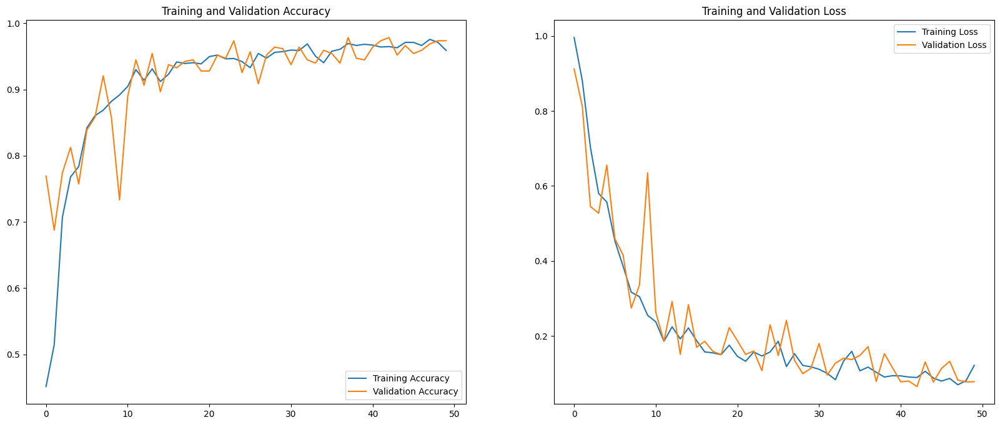

In [ ]:
EPOCHS=50
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


# Prediction of Image Label from Validation Dataset
The provided code segment predicts the label for the first image in the validation dataset (val_ds) using the trained paper-based convolutional neural network (CNN) model (model_paper).

First image to predict
Actual Label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
Predicted Label: Potato___Late_blight


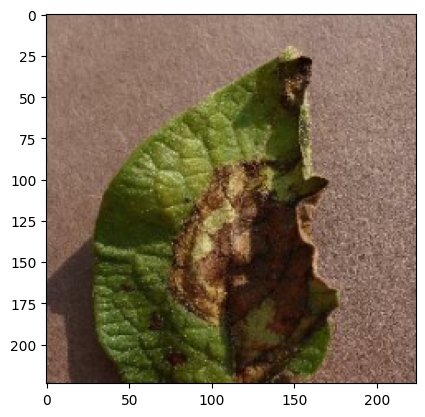

In [ ]:
import numpy as np
for images_batch, labels_batch in val_ds.take(1):
  first_image=images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:",class_names[labels_batch[0].numpy()])

  batch_prediction = model_paper.predict(images_batch)
  print("Predicted Label:",class_names[np.argmax(batch_prediction[0])])

The provided function predict accepts a model and an image as input, performs prediction using the model, and returns the predicted class along with the confidence score.

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

The provided code segment visualizes a subset of images from the validation dataset along with their predicted classes and confidence scores.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


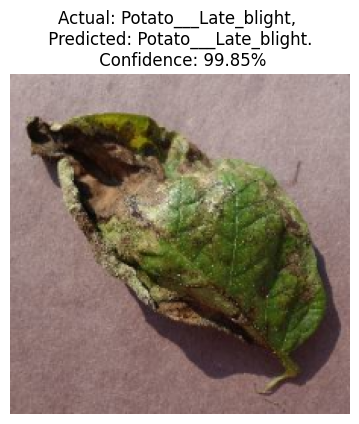

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_paper, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


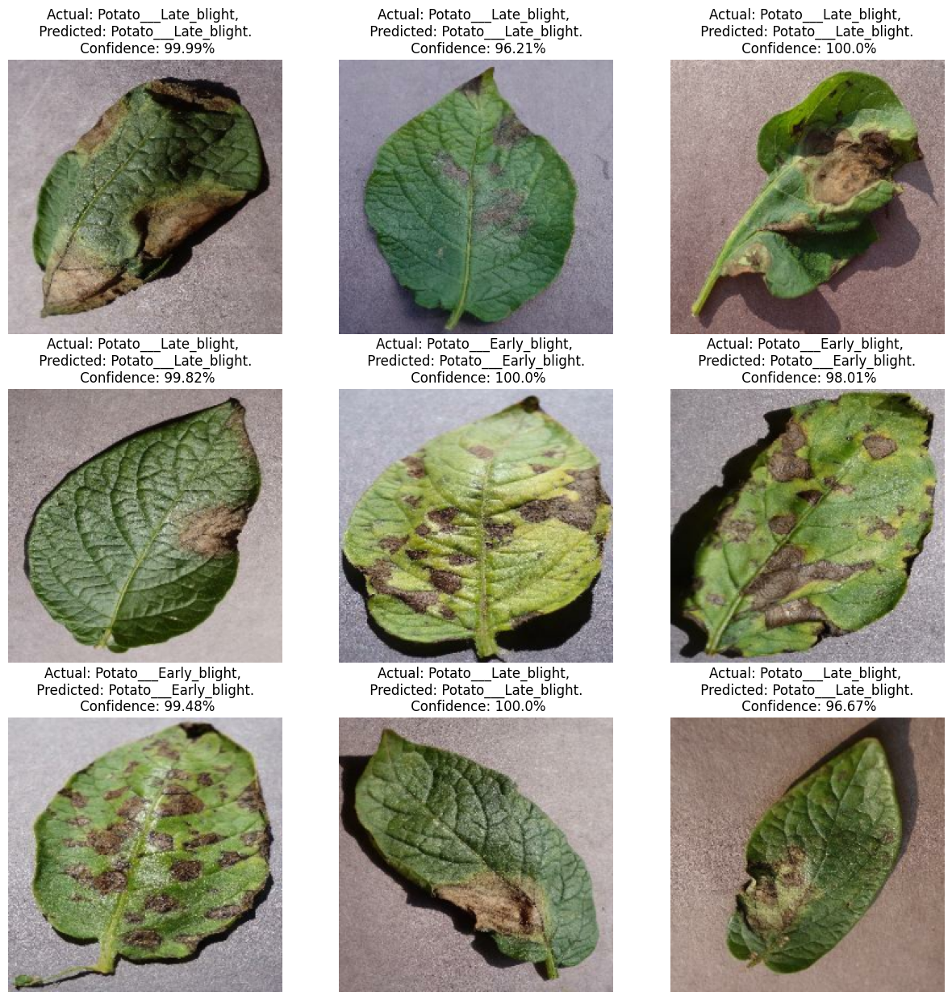

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_paper, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

The provided code snippet saves the trained paper-based CNN model (model_paper) in the TensorFlow/Keras format (.keras) at the specified location.

# Saving the Tensorflow model of the base paper

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_paper.save('/kaggle/working/model_potato_basepaper.keras')


The updated code visualizes a larger subset of images (9 images) from the validation dataset along with their predicted classes and confidence scores.

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = model_paper.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


# Calculating Classification Metrics

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Accuracy: 0.9735576923076923
Precision: 0.9738039399624766
Recall: 0.9735576923076923
F1 Score: 0.9734834422334422


# The provided code segment visualizes the confusion matrix using Seaborn's heatmap function.

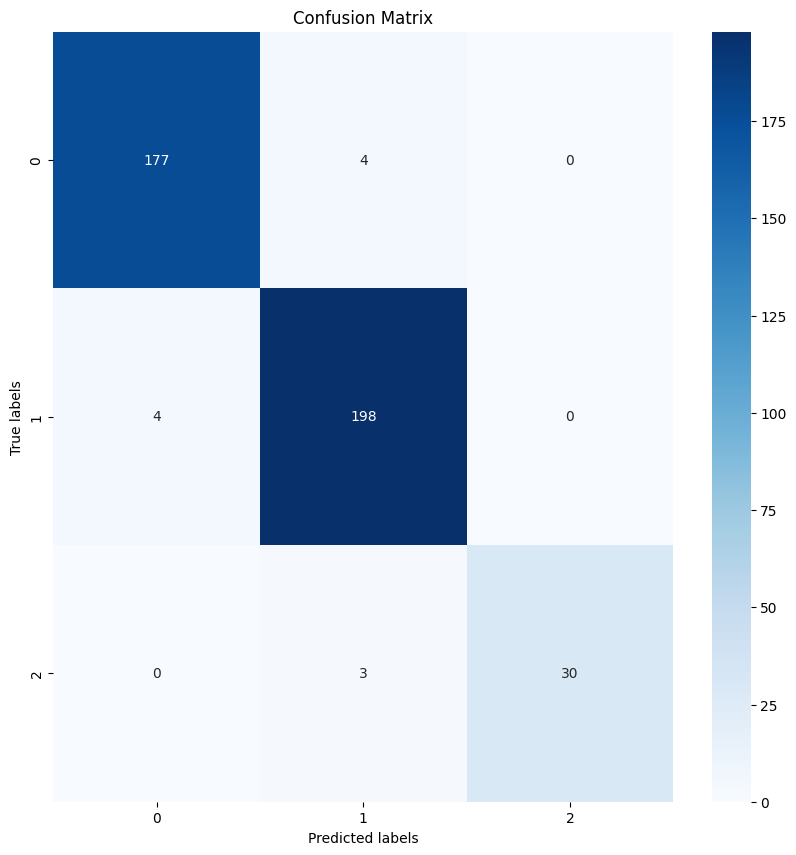

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

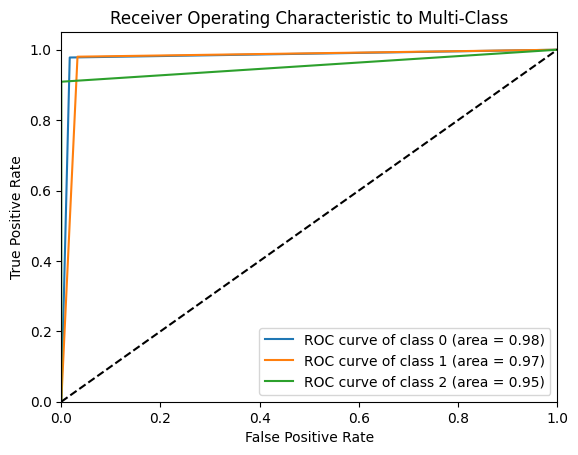

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.9667973703447693


# Using Explainable AI to explain the predictions of our own CNN model

## Taking an image and predicting it's class using our own CNN Model

First image to predict
Actual Label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Top 3 Predicted Labels: ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
Top 3 Predicted Probabilities (%): [99.99998807907104, 8.350885138952435e-06, 1.5309827699684635e-15]


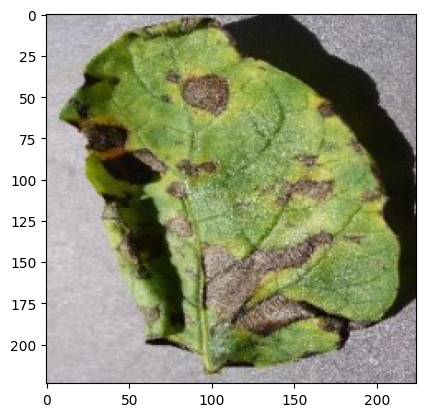

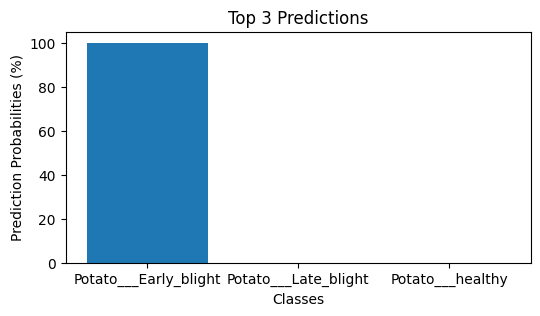

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
  first_image = images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:", class_names[labels_batch[0].numpy()])

  batch_prediction = model_1.predict(images_batch)
  top_3_pred_indices = np.argsort(batch_prediction[0])[-3:][::-1]
  top_3_pred_labels = [class_names[index] for index in top_3_pred_indices]
  top_3_pred_values = [batch_prediction[0][index] for index in top_3_pred_indices]
  top_3_pred_percentages = [value * 100 for value in top_3_pred_values]
  print("Top 3 Predicted Labels:", top_3_pred_labels)
  print("Top 3 Predicted Probabilities (%):", top_3_pred_percentages)

  # Plotting the top 3 predictions
  plt.figure(figsize=(6, 3))
  plt.bar(top_3_pred_labels, top_3_pred_percentages)
  plt.title('Top 3 Predictions')
  plt.xlabel('Classes')
  plt.ylabel('Prediction Probabilities (%)')
  plt.show()

# Model Explainability with LIME (Local Interpretable Model-Agnostic Explanations)

In [ ]:
!pip install lime

# Setting up Lime for Image Explanation
* This code snippet sets up the environment for utilizing Lime, a library for explaining image predictions, by importing necessary modules and handling the case where Lime is not initially found.

In [ ]:
%load_ext autoreload
%autoreload 2
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images_batch[0].numpy().astype('double'), model_1.predict, top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

In [ ]:
explanation

In [ ]:
from skimage.segmentation import mark_boundaries

# Superpixel for the top most Prediction

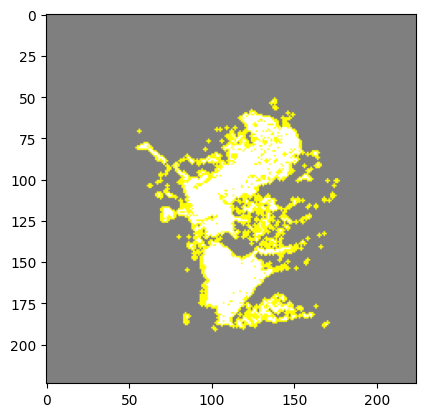

In [ ]:
#here hide_rest is True
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=3, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

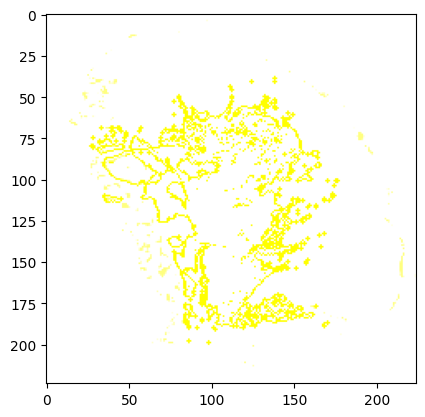

In [ ]:
#here hide_rest is False
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Visualizing 'pros and cons'

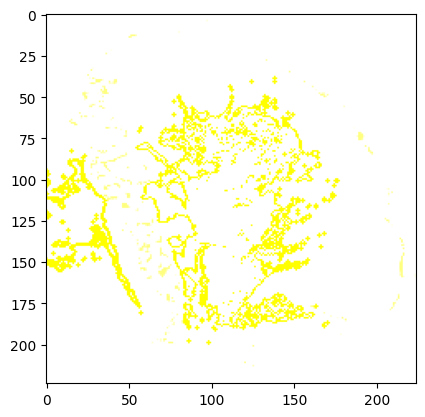

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# pros and cons
* With weight at least 0.1

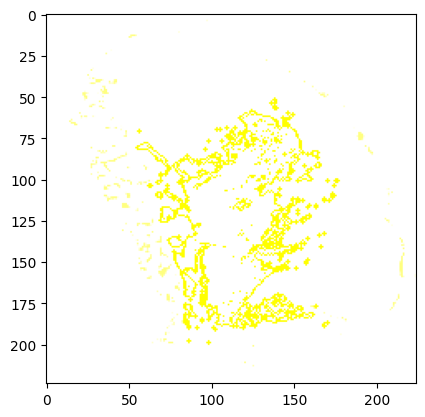

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Explaination Heatmap plot with weights
* Colorbar shows the values of the weights.

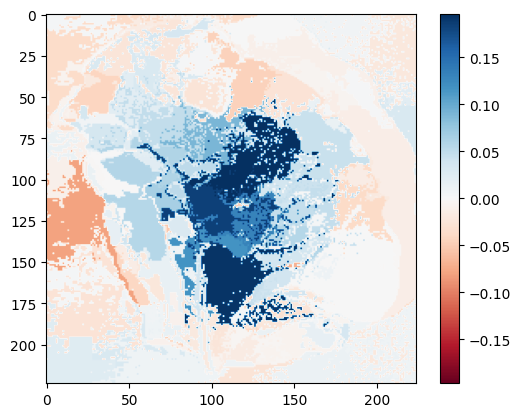

In [ ]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[0]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

# Second Prediction in the List

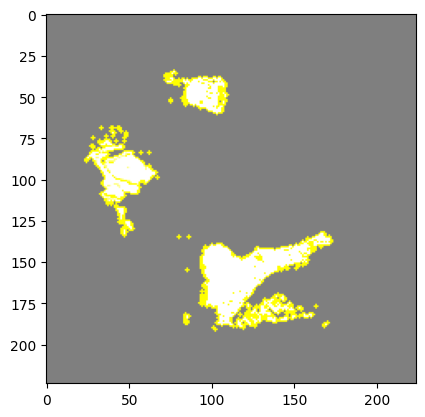

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Rest of the image from the second prediction i.e. top_labels[1]

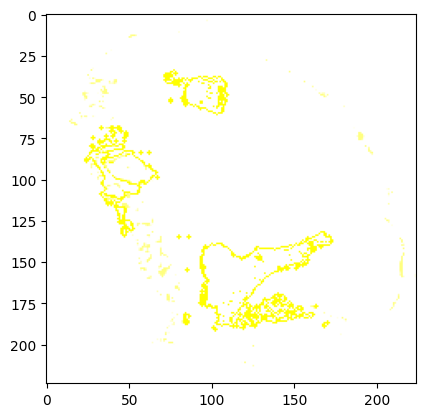

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Visualizing 'pros and cons'

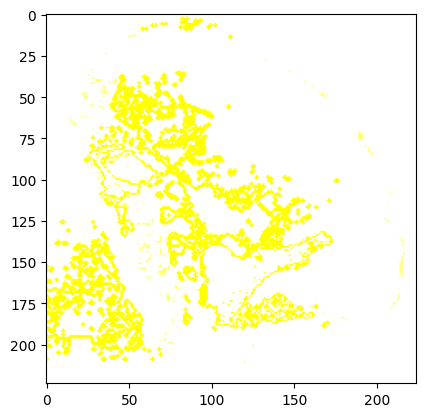

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# pros and cons
* With weight at least 0.1

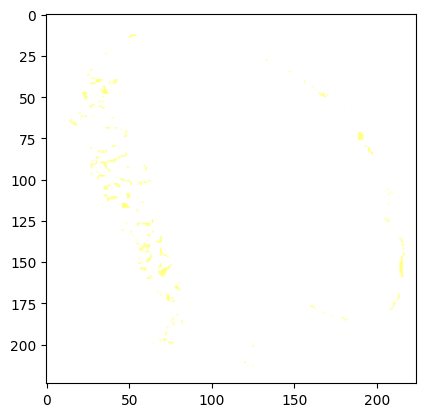

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Explaination Heatmap plot with weights
* Colorbar shows the values of the weights.

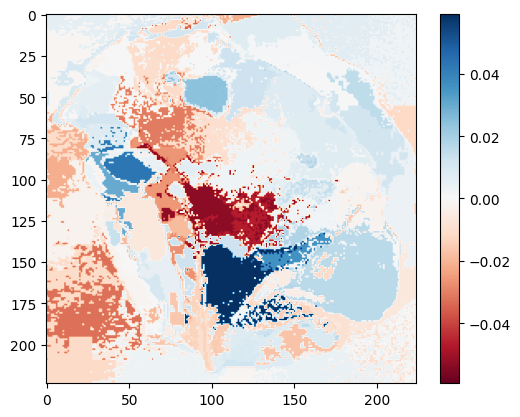

In [ ]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[1]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()


# 2nd Lime Model

In [ ]:
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
explanation = explainer.explain_instance(images_batch[0].numpy().astype('double'), model_1.predict,top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

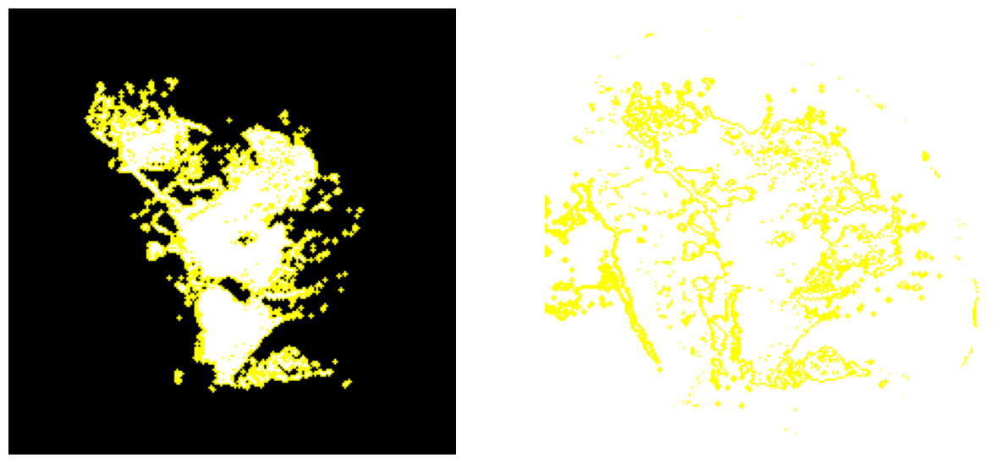

In [ ]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

plt.savefig('mask_default.png')

# Using Pre trained Models

# Pre trained Models to be used :

* ResNet50 Model
* ResNet152 Model
* InceptionV3 Model
* VGG16 Model
* VGG19 Model

In [ ]:
input_shape=(224,224,3)

# ResNet50 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50

# Assuming you have defined IMAGE_SIZE, BATCH_SIZE, and CHANNELS previously

# Load the pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224, 3))

# Freeze the weights of the pre-trained layers
for layer in resnet_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(resnet_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the ResNet base model with your custom head
resnet50_custom_model = models.Model(inputs=resnet_model.input, outputs=output_layer)

# Summary of the model
resnet50_custom_model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_9[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 36,466,691 (139.11 MB)

 Trainable params: 12,878,979 (49.13 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Compile the model
resnet50_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the ResNet model with early stopping
history_resnet50 = resnet50_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - accuracy: 0.7293 - loss: 4.6534 - val_accuracy: 0.9856 - val_loss: 0.0918
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9834 - loss: 0.0949 - val_accuracy: 0.9519 - val_loss: 0.2261
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9821 - loss: 0.1134 - val_accuracy: 0.9688 - val_loss: 0.0809
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9897 - loss: 0.0452 - val_accuracy: 0.9928 - val_loss: 0.0611
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.9904 - val_loss: 0.0967
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9997 - loss: 0.0043 - val_accuracy: 0.9952 - val_loss: 0.0821
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.9992 - loss: 0.0024 - val_accuracy: 0.9928 - val_loss: 0.1159


In [ ]:
scores_resnet50=resnet50_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9945 - loss: 0.0843


In [ ]:
scores_resnet50

[0.11590632796287537, 0.9927884340286255]

In [ ]:
acc=history_resnet50.history['accuracy']
val_acc=history_resnet50.history['val_accuracy']

loss=history_resnet50.history['loss']
val_loss=history_resnet50.history['val_loss']

In [ ]:
history_resnet50.history['accuracy']

[0.8547453880310059,
 0.9739583134651184,
 0.9837962985038757,
 0.9930555820465088,
 0.9988425970077515,
 0.9982638955116272,
 0.9994212985038757]

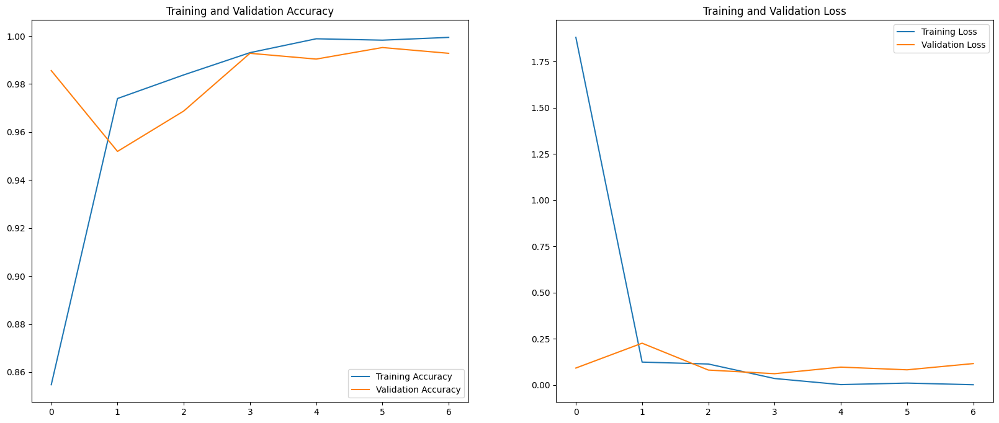

In [ ]:
EPOCHS=7
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


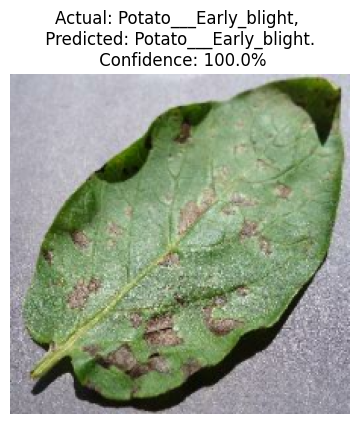

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(resnet50_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = resnet50_custom_model.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9927884615384616
Precision: 0.9928939962476547
Recall: 0.9927884615384616
F1 Score: 0.9926433363933364


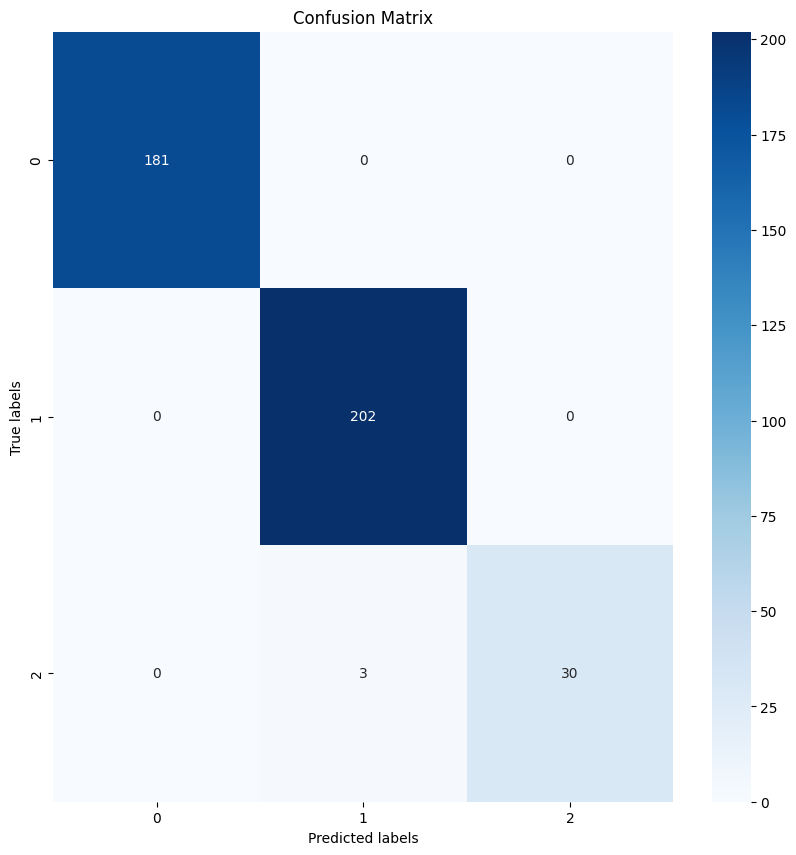

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

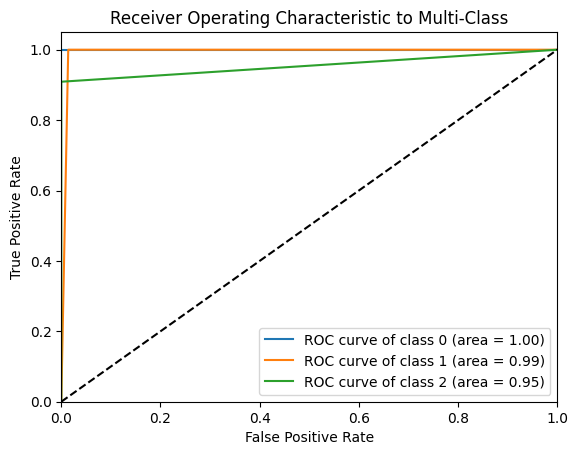

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.9772727272727272


# ResNet152 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet152

# Assuming you have defined IMAGE_SIZE, BATCH_SIZE, and CHANNELS previously

# Load the pre-trained ResNet152 model
resnet152_model = ResNet152(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in resnet152_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(resnet152_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the ResNet152 base model with your custom head
resnet152_custom_model = models.Model(inputs=resnet152_model.input, outputs=output_layer)

# Summary of the model
resnet152_custom_model.summary()

234698864/234698864 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_10[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 84,062,083 (320.67 MB)

 Trainable params: 25,691,139 (98.00 MB)

 Non-trainable params: 58,370,944 (222.67 MB)

In [ ]:
# Compile the model
resnet152_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history_resnet152 = resnet152_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 44s 342ms/step - accuracy: 0.7532 - loss: 19.1397 - val_accuracy: 0.9495 - val_loss: 0.1301
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - accuracy: 0.9699 - loss: 0.1129 - val_accuracy: 0.9856 - val_loss: 0.0801
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - accuracy: 0.9899 - loss: 0.0514 - val_accuracy: 0.9952 - val_loss: 0.0210
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - accuracy: 1.0000 - loss: 0.0054 - val_accuracy: 0.9952 - val_loss: 0.0181
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.9952 - val_loss: 0.0140
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - accuracy: 1.0000 - loss: 0.0021 - val_accuracy: 0.9952 - val_loss: 0.0142
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accuracy: 0.9952 - val_loss: 0.0133
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - accuracy: 1.0000 - loss: 8.7488e-04 - val_accur

In [ ]:
scores_resnet152=resnet152_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - accuracy: 0.9951 - loss: 0.0139


In [ ]:
scores_resnet152

[0.013308839872479439, 0.995192289352417]

In [ ]:
acc = history_resnet152.history['accuracy']
val_acc = history_resnet152.history['val_accuracy']
loss = history_resnet152.history['loss']
val_loss = history_resnet152.history['val_loss']

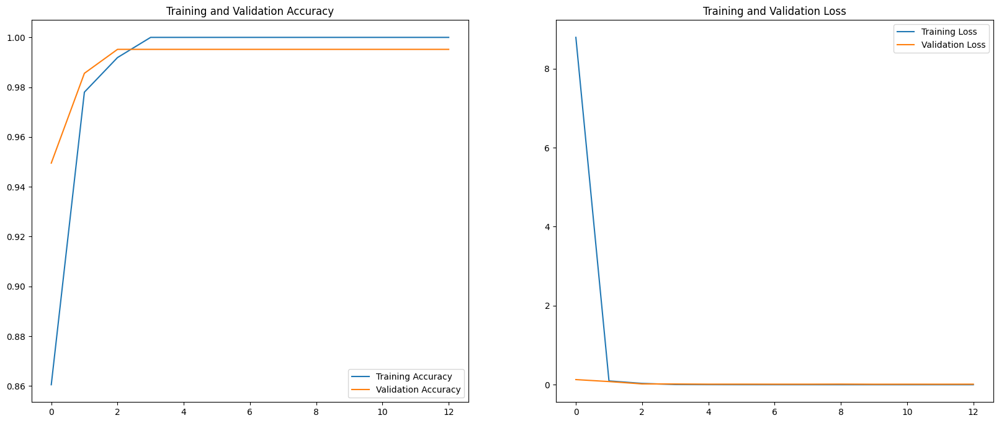

In [ ]:
EPOCHS=13
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


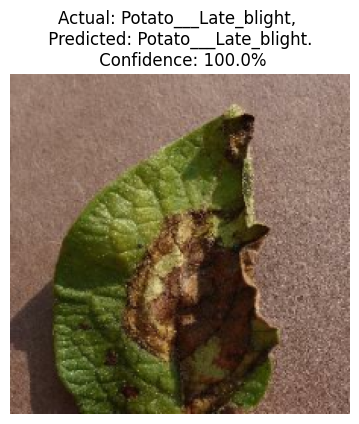

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(resnet152_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = resnet152_custom_model.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9951923076923077
Precision: 0.9952394419306183
Recall: 0.9951923076923077
F1 Score: 0.9951290291066692


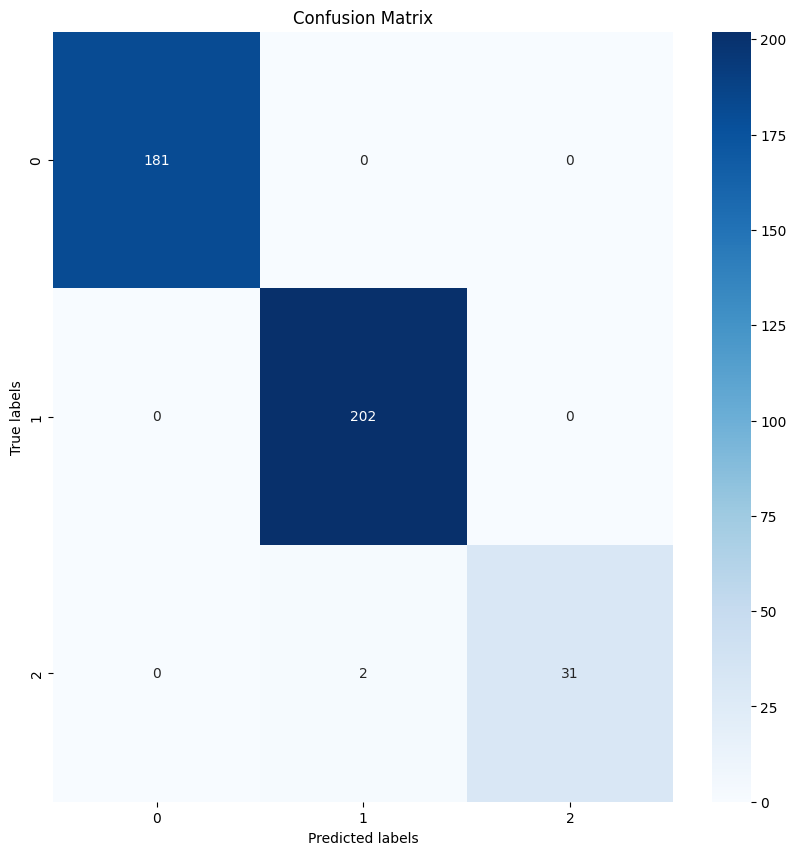

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

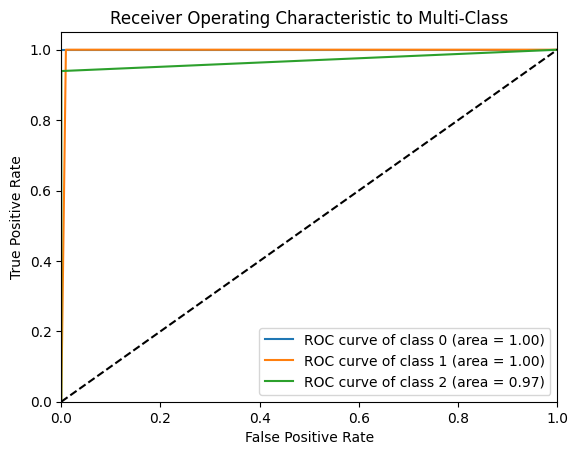

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.9848484848484849


# InceptionV3 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionV3

# Load the pre-trained InceptionV3 model without the top classification layer
inceptionv3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in inceptionv3_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(inceptionv3_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the InceptionV3 base model with your custom head
inceptionv3_custom_model = models.Model(inputs=inceptionv3_model.input, outputs=output_layer)

# Summary of the InceptionV3 model
inceptionv3_custom_model.summary()

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_111 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_12[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_111[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_94       │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_112 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_94[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_112[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_95       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_113 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_95[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_113[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_21    │ (None, 54, 54,    │          0 │ activation_96[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_114 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_21… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_114[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_115 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_97[0]… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_115[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_98       │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 28,390,307 (108.30 MB)

 Trainable params: 6,587,523 (25.13 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# Compile the model
inceptionv3_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the InceptionV3 model
history_inceptionv3 = inceptionv3_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - accuracy: 0.5690 - loss: 52.0034 - val_accuracy: 0.7163 - val_loss: 8.6706
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7666 - loss: 6.0035 - val_accuracy: 0.8558 - val_loss: 2.0470
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - accuracy: 0.8490 - loss: 1.4236 - val_accuracy: 0.7212 - val_loss: 4.0333
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8228 - loss: 1.8078 - val_accuracy: 0.8726 - val_loss: 1.0456
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8851 - loss: 0.9009 - val_accuracy: 0.7885 - val_loss: 1.9766
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8866 - loss: 0.9537 - val_accuracy: 0.7548 - val_loss: 2.1005
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8612 - loss: 1.0500 - val_accuracy: 0.9279 - val_loss: 0.5152
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9092 - loss: 0.5658 - val_accuracy: 0.9087 

In [ ]:
scores=inceptionv3_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.9012 - loss: 1.0656


In [ ]:
scores

[1.096204400062561, 0.8870192170143127]

In [ ]:
history_inceptionv3.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_inceptionv3.history['accuracy']
val_acc=history_inceptionv3.history['val_accuracy']

loss=history_inceptionv3.history['loss']
val_loss=history_inceptionv3.history['val_loss']

In [ ]:
history_inceptionv3.history['accuracy']

[0.6267361044883728,
 0.7864583134651184,
 0.8402777910232544,
 0.8535879850387573,
 0.8773148059844971,
 0.8767361044883728,
 0.875,
 0.8778935074806213,
 0.8958333134651184,
 0.8553240895271301]

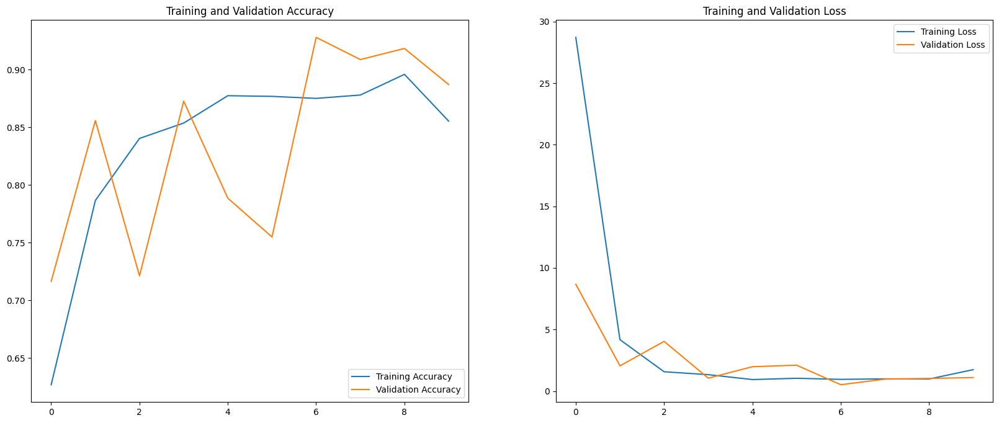

In [ ]:
EPOCHS=10
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


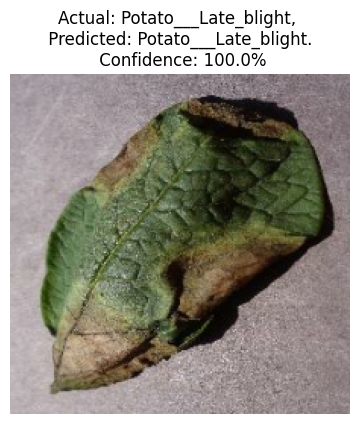

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(inceptionv3_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = inceptionv3_custom_model.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.8870192307692307
Precision: 0.9008632025315015
Recall: 0.8870192307692307
F1 Score: 0.8916976628936933


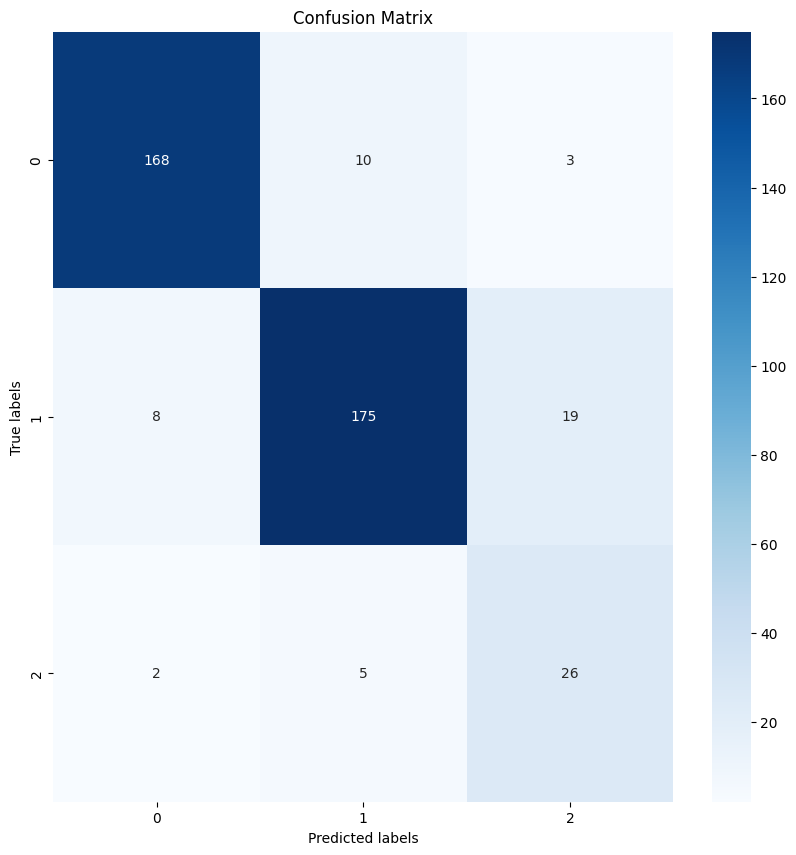

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

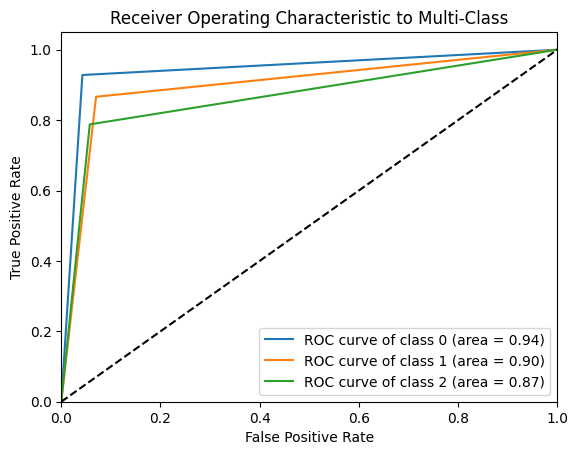

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.895598054280566


# VGG16 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

# Load the pre-trained VGG16 model without the top classification layer
vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in vgg16_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(vgg16_model.output)
#dense_layer_1 = layers.Dense(64, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(128, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the VGG16 base model with your custom head
vgg16_custom_model_1 = models.Model(inputs=vgg16_model.input, outputs=output_layer)

# Summary of the VGG16 model
vgg16_custom_model_1.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,926,467 (68.38 MB)

 Trainable params: 3,211,779 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Compile the model
vgg16_custom_model_1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the ResNet model with early stopping
history_vgg16_custom_model_1 = vgg16_custom_model_1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)


Epoch 1/50


2024-04-21 11:00:53.606962: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.63498, expected 3.85968
2024-04-21 11:00:53.607020: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.55784, expected 5.78254
2024-04-21 11:00:53.607030: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 6.61282, expected 5.83752
2024-04-21 11:00:53.607037: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.34499, expected 5.56968
2024-04-21 11:00:53.607045: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 6.25159, expected 5.47629
2024-04-21 11:00:53.607053: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 5.43964, expected 4.66434
2024-04-21 11:00:53.607061: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 6.54333, expected 5.76803
2024-04-21 11:00:53.607068: E external/local_xla/xla/se

54/54 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - accuracy: 0.6875 - loss: 36.4608 - val_accuracy: 0.9567 - val_loss: 0.3002
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.9530 - loss: 0.3785 - val_accuracy: 0.9808 - val_loss: 0.1281
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.9905 - loss: 0.0498 - val_accuracy: 0.9904 - val_loss: 0.0957
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.9940 - loss: 0.0274 - val_accuracy: 0.9880 - val_loss: 0.1214
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.9927 - loss: 0.0408 - val_accuracy: 0.9880 - val_loss: 0.0974
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.9948 - loss: 0.0689 - val_accuracy: 0.9880 - val_loss: 0.0834
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.9930 - loss: 0.0287 - val_accuracy: 0.9880 - val_loss: 0.0998
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.9979 - loss: 0.0187 - val_accuracy: 0.9856 - val_loss: 

In [ ]:
scores=vgg16_custom_model_1.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.9591 - loss: 0.2596


In [ ]:
scores

[0.385332316160202, 0.9543269276618958]

In [ ]:
history_vgg16_custom_model_1.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_vgg16_custom_model_1.history['accuracy']
val_acc=history_vgg16_custom_model_1.history['val_accuracy']

loss=history_vgg16_custom_model_1.history['loss']
val_loss=history_vgg16_custom_model_1.history['val_loss']


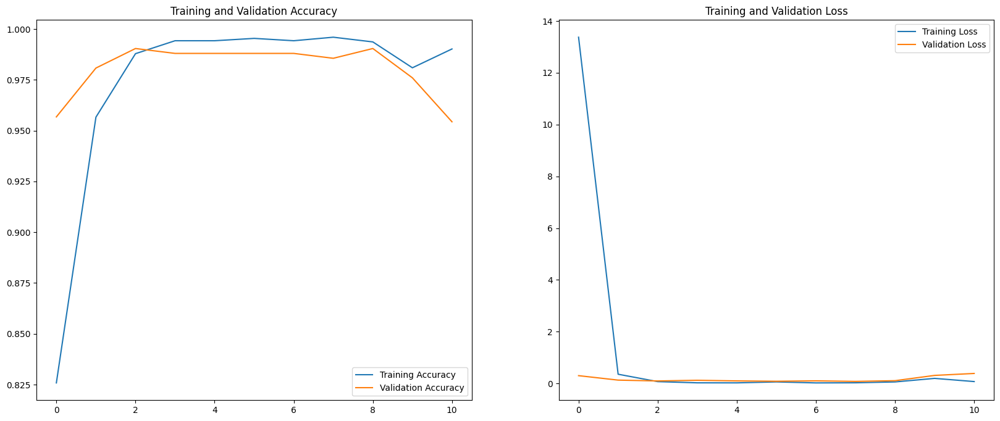

In [ ]:
EPOCHS=11
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

2024-04-21 11:02:35.975927: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.42855, expected 3.64542
2024-04-21 11:02:35.975984: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.87036, expected 5.08723
2024-04-21 11:02:35.976001: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 6.04003, expected 5.2569
2024-04-21 11:02:35.976017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.22034, expected 5.43722
2024-04-21 11:02:35.976032: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.90026, expected 4.11714
2024-04-21 11:02:35.976043: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.21068, expected 4.42756
2024-04-21 11:02:35.976054: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.92061, expected 5.13748
2024-04-21 11:02:35.976065: E external/local_xla/xla/ser

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


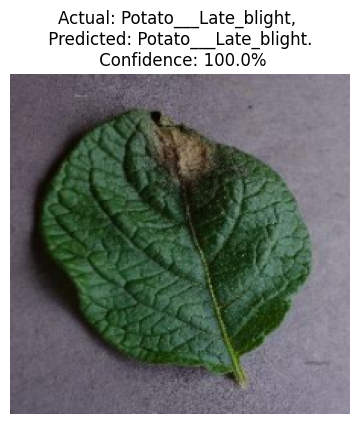

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(vgg16_custom_model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = vgg16_custom_model_1.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9543269230769231
Precision: 0.9575150345115693
Recall: 0.9543269230769231
F1 Score: 0.9541795490829794


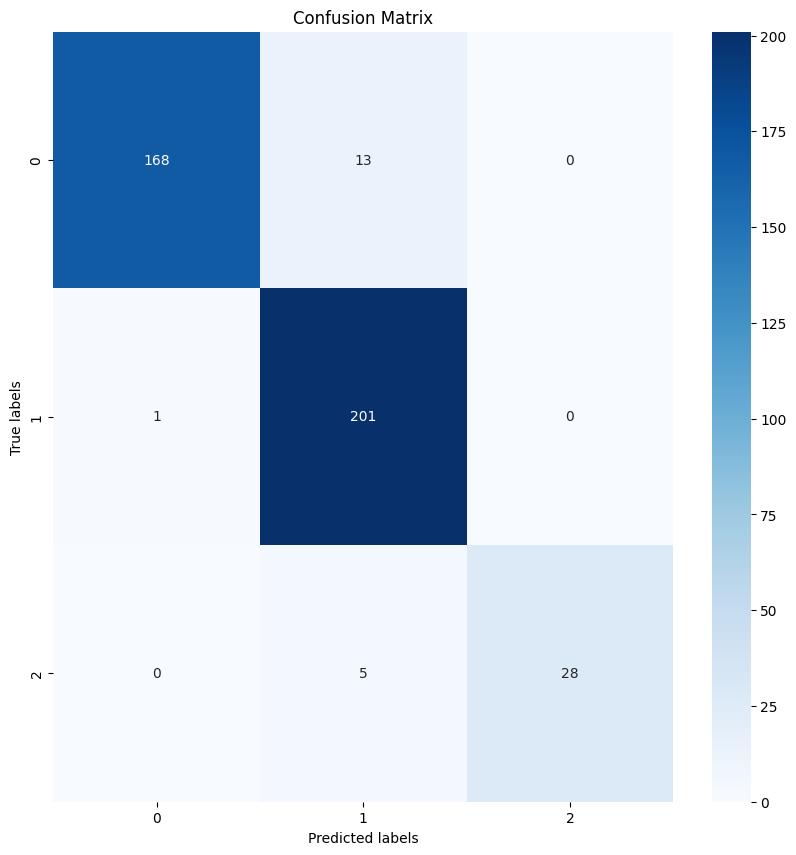

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

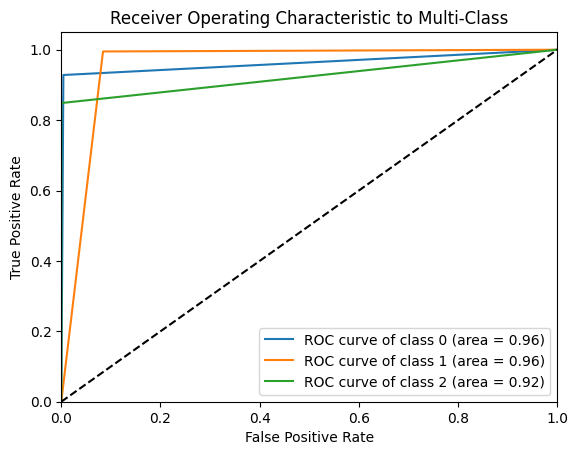

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.9429277872538634


# VGG19 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG19

# Load the pre-trained VGG19 model without the top classification layer
vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in vgg19_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(vgg19_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_1)

# Combine the VGG19 base model with your custom head
vgg19_custom_model = models.Model(inputs=vgg19_model.input, outputs=output_layer)

# Summary of the VGG19 model
vgg19_custom_model.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 3)              │           38

 Total params: 23,236,163 (88.64 MB)

 Trainable params: 3,211,779 (12.25 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
# Compile the model
vgg19_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the VGG19 model with early stopping
history_vgg19 = vgg19_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - accuracy: 0.6610 - loss: 43.7454 - val_accuracy: 0.9303 - val_loss: 0.2271
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9365 - loss: 0.2244 - val_accuracy: 0.9495 - val_loss: 0.1649
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9613 - loss: 0.1293 - val_accuracy: 0.9663 - val_loss: 0.1270
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9711 - loss: 0.1033 - val_accuracy: 0.9760 - val_loss: 0.1117
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9781 - loss: 0.0810 - val_accuracy: 0.9784 - val_loss: 0.1126
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9894 - loss: 0.0850 - val_accuracy: 0.9760 - val_loss: 0.1200
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.9845 - loss: 0.0870 - val_accuracy: 0.9736 - val_loss: 0.1223


In [ ]:
scores=vgg19_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.9852 - loss: 0.1013


In [ ]:
history_vgg19.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_vgg19.history['accuracy']
val_acc=history_vgg19.history['val_accuracy']

loss=history_vgg19.history['loss']
val_loss=history_vgg19.history['val_loss']

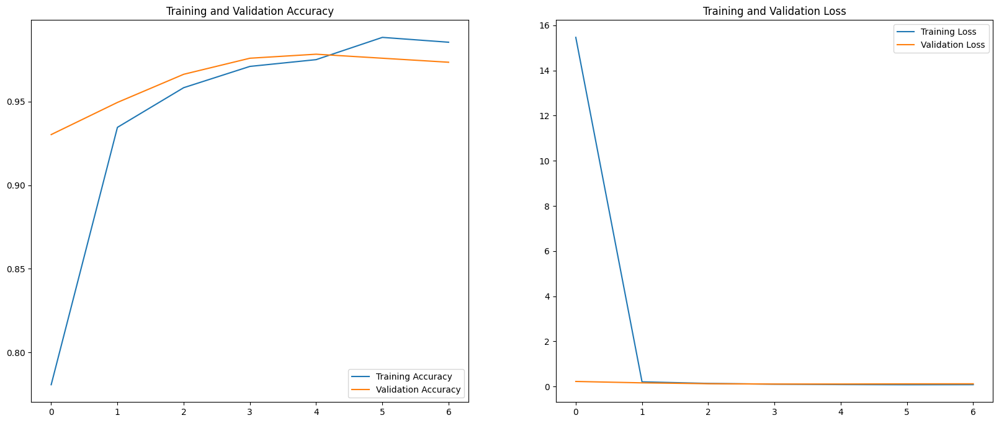

In [ ]:
EPOCHS=7
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


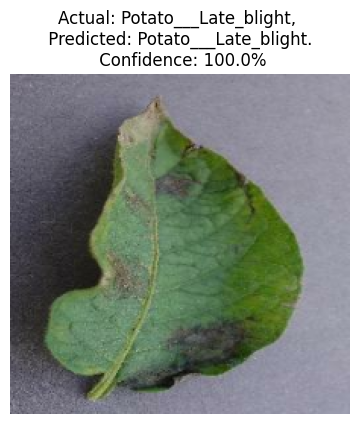

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(vgg19_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = vgg19_custom_model.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9735576923076923
Precision: 0.9744997037276448
Recall: 0.9735576923076923
F1 Score: 0.9739048482892112


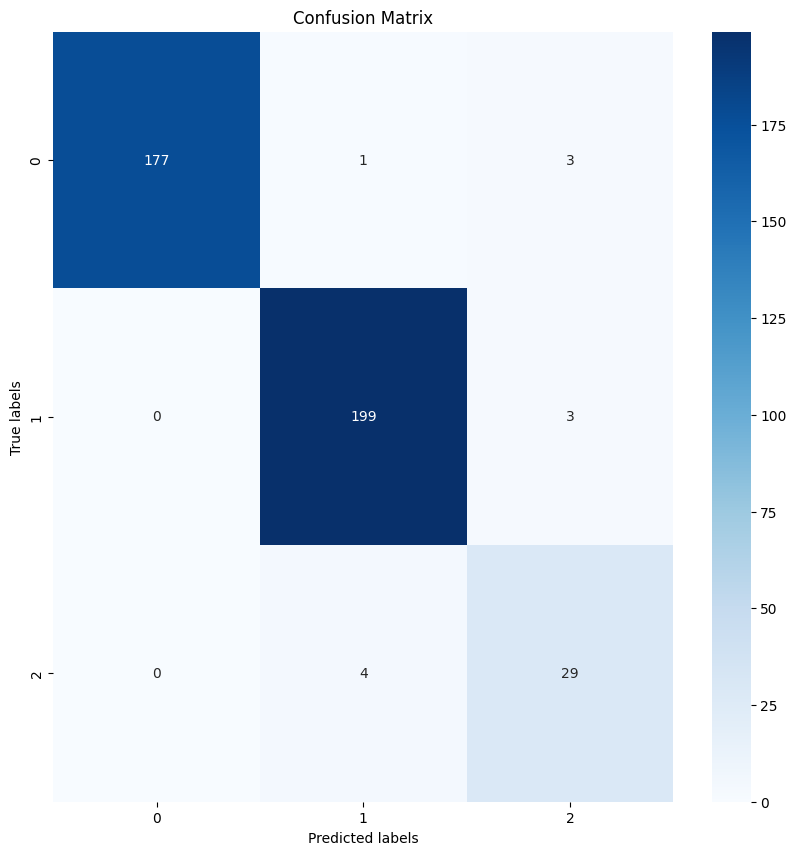

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

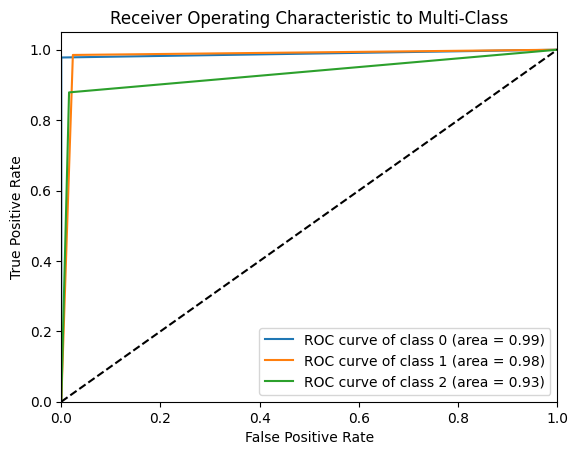

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Binarize the output
lb = LabelBinarizer()
lb.fit(y_true)
y_test = lb.transform(y_true)
y_pred = lb.transform(y_pred)

n_classes = y_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Assuming y_true and y_pred are defined
# 'ovo' stands for One-vs-One
# 'macro' calculates metrics for each label, and finds their unweighted mean
auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='macro')

print(f'AUC Score: {auc}')  # (AUC Score = Area Under the ROC Curve)

AUC Score: 0.9604592365313879


# Comparing Accuracy of Pre Trained Models with Our Own CNN Model:
### ResNet50 Model: 99.27%
### ResNet152 Model: 99.51%
### InceptionV3 Model: 88.70%
### VGG16 Model: 95.43%
### VGG19 Model: 97.35%